# Tutorial 2: Nanostring Dataset

In [1]:
## setup the font

import matplotlib.pyplot as plt
import matplotlib.font_manager as fm

font_name = 'DejaVu Sans'

plt.rcParams['font.family'] = font_name
plt.rcParams['font.size'] = 12

font_path = fm.findfont(fm.FontProperties(family=font_name))
plt.rcParams['font.sans-serif'] = font_path



import warnings
warnings.filterwarnings("ignore", category=FutureWarning)
warnings.filterwarnings("ignore", category=UserWarning)

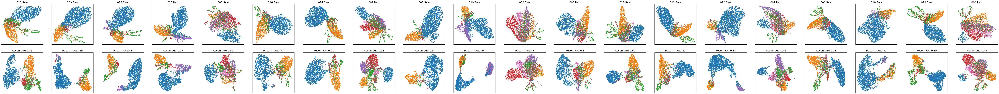

In [2]:
## Umap for Nano (scanpy)

label_map = {'tumors': 0, 'fibroblast': 1, 'lymphocyte': 2, 'Mcell': 3, 'neutrophil': 4, 'endothelial': 5, 'epithelial': 6, 'mast': 7}

def load_Nano_data(id, root_path='./'):
    data = pd.read_csv(os.path.join(root_path, 'all_in_one.csv'))
    gene_feature_col = pd.read_csv(os.path.join(root_path, 'Lung9_Rep1_exprMat_file.csv')).columns[2:] #980 gene-related features 
    
    if data is None:
        data = pd.read_csv('all_in_one.csv')
    elif type(data) == str:
        data = pd.read_csv(data)

    y = data[data['fov'] == id]['cell_type'] # the cell type is string type
    y = y.map(label_map).to_numpy()

    gene_fea = data[data['fov'] == id][gene_feature_col].to_numpy().astype(float)

    return gene_fea, y


## Nanostring

import pandas as pd
import os
import numpy as np
import umap
import matplotlib.pyplot as plt
import yaml
import anndata
from pathlib import Path
import scanpy as sc

c_list = plt.get_cmap('tab10').colors
path = '../best_res/Nanostring'
fig, ax = plt.subplots(2, 20, figsize=(100, 9))

for i, id in enumerate(os.listdir(path)):
    if id == 'ALL':
        continue
    emb_raw, gt = load_Nano_data(int(id), root_path='../../Nanostring/')
    adata = anndata.AnnData(X=emb_raw)
    adata.obs['gt'] = pd.DataFrame(gt).values.astype(str)
    sc.pp.neighbors(adata, use_rep='X')
    sc.tl.umap(adata)
    sc.pl.umap(adata, color=['gt'], ax=ax[0, i], show=False, title=id+' Raw')
    
    cfg = os.listdir(os.path.join(path, id))[0]
    ARI_hyper = yaml.safe_load(open(os.path.join(path, id, cfg, 'config.yaml'), 'r'))['ARI_hyper']
    emb_enhanced = np.load(os.path.join(path, id, cfg, 'recon_RNA.npy'))
        
    adata.obsm['recon'] = emb_enhanced
    sc.pp.neighbors(adata, use_rep='recon', key_added='recon')
    sc.tl.umap(adata, neighbors_key='recon')
    sc.pl.umap(adata, color=['gt'], ax=ax[1, i], show=False, layer='recon')
    
    ax[0, i].get_legend().remove()
    ax[0, i].set_xlabel('')
    ax[0, i].set_ylabel('')
    
    ax[1, i].get_legend().remove()
    ax[1, i].set_xlabel('')
    ax[1, i].set_ylabel('')
    ax[1, i].set_title('Recon  ARI:'+str(round(ARI_hyper, 2)))
 
Path(os.path.join('../figs', 'tsne_raw_enhanced')).mkdir(parents=True, exist_ok=True)
plt.savefig(os.path.join('../figs', 'tsne_raw_enhanced', 'sc_umap_Nanostring.png'), dpi=200, bbox_inches='tight')

In [ ]:
## raw and reconstruction comparison

label_map = {'tumors': 0, 'fibroblast': 1, 'lymphocyte': 2, 'Mcell': 3, 'neutrophil': 4, 'endothelial': 5, 'epithelial': 6, 'mast': 7}

def load_Nano_data(id, root_path='./'):
    data = pd.read_csv(os.path.join(root_path, 'all_in_one.csv'))
    gene_feature_col = pd.read_csv(os.path.join(root_path, 'Lung9_Rep1_exprMat_file.csv')).columns[2:] #980 gene-related features 
    
    if data is None:
        data = pd.read_csv('all_in_one.csv')
    elif type(data) == str:
        data = pd.read_csv(data)

    y = data[data['fov'] == id]['cell_type'] # the cell type is string type
    y = y.map(label_map).to_numpy()

    gene_fea = data[data['fov'] == id][gene_feature_col].to_numpy().astype(float)
    
    return gene_fea, y, np.array([data[data['fov'] == id]['CenterY_local_px'], data[data['fov'] == id]['CenterX_local_px']]).T, gene_feature_col


## Nanostring

import pandas as pd
import os
import numpy as np
import matplotlib.pyplot as plt
import yaml
import anndata
from pathlib import Path

c_list = plt.get_cmap('tab10').colors
path = '../best_res/Nanostring'
fig, ax = plt.subplots(2, 20, figsize=(100, 9))

# gene_names = ['EPCAM']
gene_names = ['EPCAM', 'KRT7', 'SOX4']
cmap = 'viridis'
size = 2
for gene_name in gene_names:
    # for i, id in enumerate(['001']):
    for i, id in enumerate(os.listdir(path)):
        if id == 'ALL':
            continue
        emb_raw, gt, loc, gene_id = load_Nano_data(int(id), root_path='../../Nanostring/')
        idx = gene_id.to_list().index(gene_name)
        adata = anndata.AnnData(X=emb_raw)

        cfg = os.listdir(os.path.join(path, id))[0]
        ARI_hyper = yaml.safe_load(open(os.path.join(path, id, cfg, 'config.yaml'), 'r'))['ARI_hyper']
        emb_enhanced = np.load(os.path.join(path, id, cfg, 'recon_RNA.npy'))
        adata.obsm['recon'] = emb_enhanced
        
        adata.X /= adata.X.max(axis=0).reshape(1, -1)
        adata.obsm['recon'] = np.where(adata.obsm['recon']<0, 0, adata.obsm['recon'])
        adata.obsm['recon'] /= (adata.obsm['recon'].max(axis=0).reshape(1, -1) + 1e-10)

        ax[0, i].scatter(loc[:, 0], loc[:, 1], c=adata.X[:, idx], cmap=cmap, s=size)
        ax[1, i].scatter(loc[:, 0], loc[:, 1], c=adata.obsm['recon'][:, idx], cmap=cmap, s=size)

        ax[0, i].set_xticks([])
        ax[0, i].set_yticks([])
        
        ax[1, i].set_xticks([])
        ax[1, i].set_yticks([])
        ax[0, i].set_title('Raw  '+str(id).zfill(3))
        ax[1, i].set_title('Recon  ARI:'+str(round(ARI_hyper, 2)))
    
        import matplotlib.cm as cm
        import matplotlib.colors as colors
        norm = colors.Normalize(vmin=0, vmax=1)
        mappable = cm.ScalarMappable(norm=norm, cmap=cmap)
        cbar_ax = fig.add_axes([0.91, 0.15, 0.001, 0.7])
        fig.colorbar(mappable, cax=cbar_ax)
        
    Path(os.path.join('../figs', 'Nanostring')).mkdir(parents=True, exist_ok=True)
    plt.savefig(os.path.join('../figs', 'Nanostring', 'raw_recon_Expression_comparison_'+gene_name+'.png'), dpi=200, bbox_inches='tight')

In [6]:
## Umap for all Nano slices (scanpy)

import os
path = '../best_res/Nanostring/'
file_path = [f for f in os.listdir(os.path.join(path, 'ALL')) if f[0].isdigit()][0]
emb_enhanced_list = []

for i in range(1, 21):
    file = 'recon_RNA_'+str(i)+'.npy'
    emb_enhanced_list.append(np.load(os.path.join(path, 'ALL', file_path, file)))


import warnings
warnings.filterwarnings("ignore", category=FutureWarning)
warnings.filterwarnings("ignore", category=UserWarning)

import pandas as pd
import os
import numpy as np
import umap
import matplotlib.pyplot as plt
import yaml
import anndata
from pathlib import Path
import scanpy as sc

path = '../best_res/Nanostring'

adata_list = []
for id in range(1, 21):
    
    emb_raw, gt, loc, gene_id = load_Nano_data(id, root_path='../../Nanostring/')
    adata = anndata.AnnData(X=emb_raw)
    adata.obs['gt'] = pd.DataFrame(gt).values.astype(str)
    
    adata_list.append(adata)
 
adata = anndata.concat(adata_list)
adata.obs_names_make_unique()

adata_recon = adata.copy()
adata_recon.X = np.vstack(emb_enhanced_list)

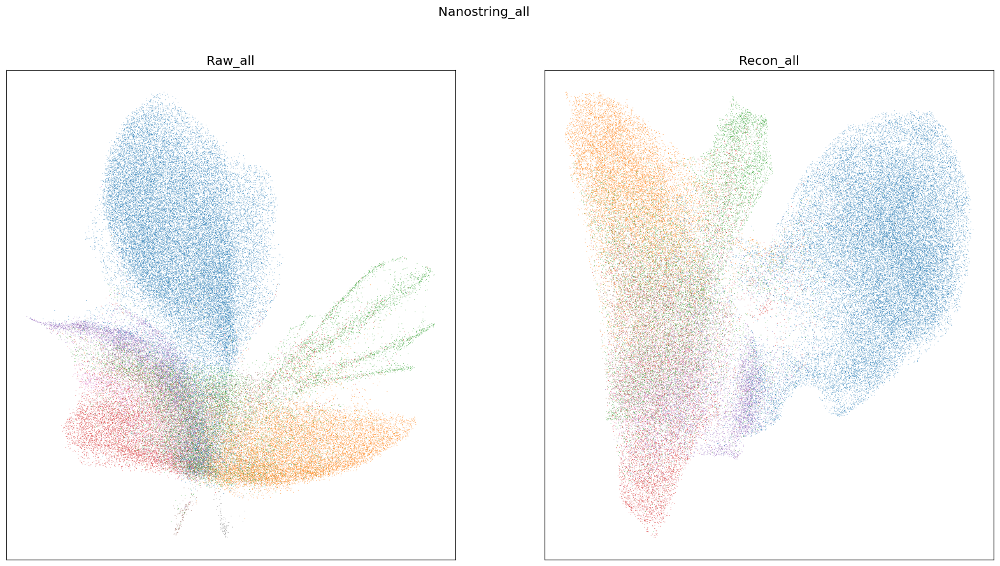

In [7]:
fig, ax = plt.subplots(1, 2, figsize=(20, 10))

n_neighbors = 15

sc.pp.neighbors(adata, use_rep='X', n_neighbors=n_neighbors)
sc.tl.umap(adata)
sc.pl.umap(adata, color=['gt'], ax=ax[0], show=False)

# sc.pp.neighbors(adata_recon, use_rep='X', n_neighbors=n_neighbors, metric='cosine')
sc.pp.neighbors(adata_recon, use_rep='X', n_neighbors=n_neighbors)
sc.tl.umap(adata_recon)
sc.pl.umap(adata_recon, color=['gt'], ax=ax[1], show=False)

ax[0].get_legend().remove()
ax[0].set_xlabel('')
ax[0].set_ylabel('')

ax[1].get_legend().remove()
ax[1].set_xlabel('')
ax[1].set_ylabel('')

ax[0].set_title('Raw_all')
ax[1].set_title('Recon_all')
fig.suptitle('Nanostring_all')
Path(os.path.join('../figs', 'tsne_raw_enhanced')).mkdir(parents=True, exist_ok=True)
plt.savefig(os.path.join('../figs', 'tsne_raw_enhanced', 'sc_umap_Nanostring_all_cotrain.png'), dpi=500, bbox_inches='tight')

In [8]:
df = pd.read_csv('/home/wangpenglei/SC/Nanostring/all_in_one.csv')
gene_names = df.columns.to_list()[-980:]
adata.var_names = gene_names
adata_recon.var_names = gene_names

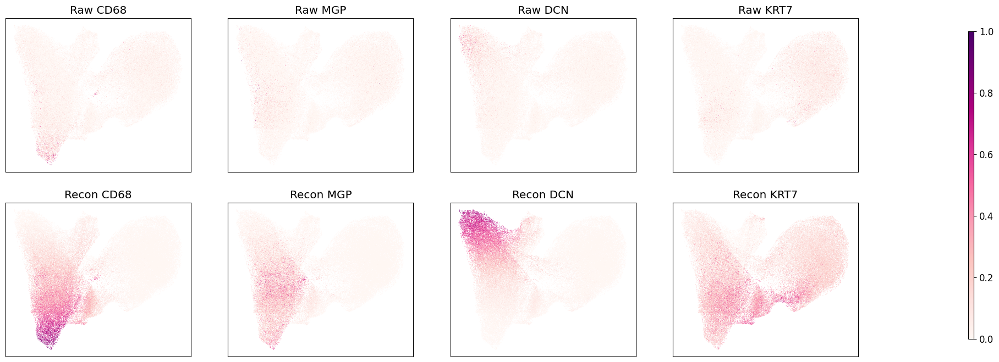

In [9]:
# normalized into [0, 1]

adata_ = adata.copy()
adata_recon_ = adata_recon.copy()

X = adata_recon_.X
X = np.where(X<0, 0, X)
X /= X.max(axis=0).reshape(1, -1)
adata_recon_.X = X

X = adata_.X
X /= X.max(axis=0).reshape(1, -1)
adata_.X = X

adata_.obsm['X_umap'] = adata_recon_.obsm['X_umap']

import matplotlib.pyplot as plt
import matplotlib.cm as cm
import matplotlib.colors as colors

cmap = plt.get_cmap('RdPu')

fig, ax = plt.subplots(2, 4, figsize=(20, 8))

for i, gene_id in enumerate(['CD68', 'MGP', 'DCN', 'KRT7']):
    sc.pl.umap(adata_, color=gene_id, color_map=cmap, ax=ax[0, i], show=False, colorbar_loc=None)
    sc.pl.umap(adata_recon_, color=gene_id, color_map=cmap, ax=ax[1, i], show=False, colorbar_loc=None)

    ax[0, i].set_xlabel('')
    ax[0, i].set_ylabel('')
    ax[1, i].set_xlabel('')
    ax[1, i].set_ylabel('')
    ax[0, i].set_title('Raw ' + gene_id)
    ax[1, i].set_title('Recon ' + gene_id)

norm = colors.Normalize(vmin=0, vmax=1)
mappable = cm.ScalarMappable(norm=norm, cmap=cmap)
cbar_ax = fig.add_axes([1, 0.15, 0.005, 0.7])
fig.colorbar(mappable, cax=cbar_ax)

plt.savefig('../figs/tsne_raw_enhanced/raw_enhanced_gene_cotrain.png', dpi=500, bbox_inches='tight')

In [10]:
label_map = {'tumors': 0, 'fibroblast': 1, 'lymphocyte': 2, 'Mcell': 3, 'neutrophil': 4, 'endothelial': 5, 'epithelial': 6, 'mast': 7}
cell_type = [k for k in label_map.keys()]
label = [str(v) for v in label_map.values()]
cell_map = dict(zip(label, cell_type))

adata.obs['cell_type'] = adata.obs['gt'].map(cell_map)
adata_recon.obs['cell_type'] = adata.obs['gt'].map(cell_map)

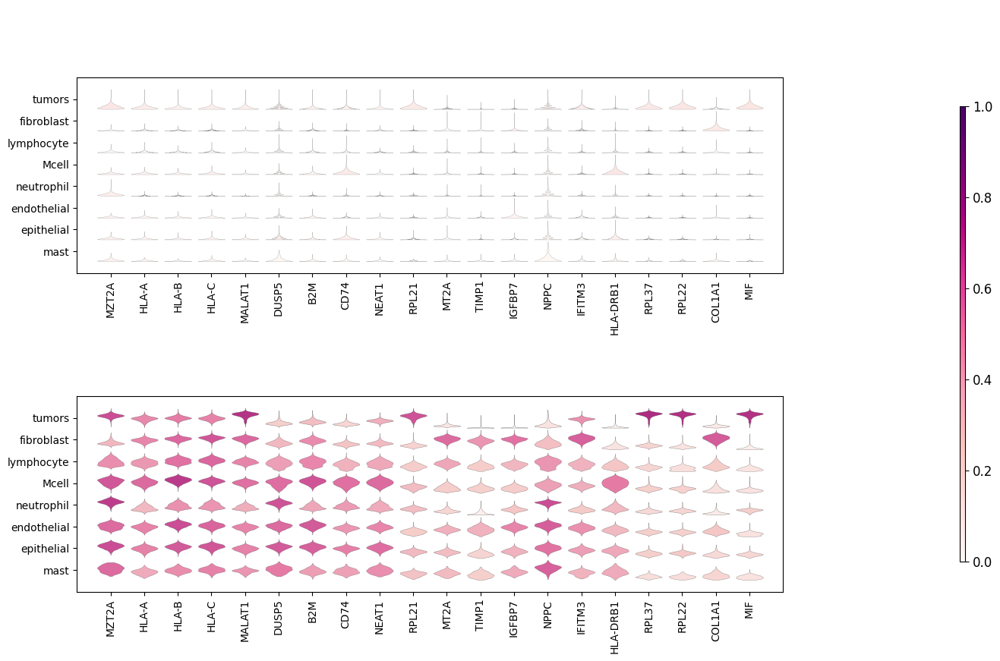

In [11]:
adata_ = adata.copy()
adata_recon_ = adata_recon.copy()

X = adata_recon_.X
X = np.where(X<0, 0, X)
X /= X.max(axis=0).reshape(1, -1)
adata_recon_.X = X

X = adata_.X
X /= X.max(axis=0).reshape(1, -1)
adata_.X = X

marker_genes_dict = ['MZT2A','HLA-A','HLA-B','HLA-C','MALAT1','DUSP5','B2M','CD74','NEAT1','RPL21','MT2A','TIMP1','IGFBP7','NPPC','IFITM3','HLA-DRB1','RPL37','RPL22','COL1A1','MIF']

cmap = plt.get_cmap('RdPu')
fig, ax = plt.subplots(2, 1, figsize=(15, 10))

ax_dict = sc.pl.stacked_violin(adata_, marker_genes_dict, groupby='cell_type', vmax=1, ax=ax[0], show=False, cmap=cmap)
ax_dict['color_legend_ax'].remove()

ax_dict = sc.pl.stacked_violin(adata_recon_, marker_genes_dict, groupby='cell_type', vmax=1, ax=ax[1], show=False, cmap=cmap)
ax_dict['color_legend_ax'].remove()

import matplotlib.colors as colors
import matplotlib.cm as cm
norm = colors.Normalize(vmin=0, vmax=1)
mappable = cm.ScalarMappable(norm=norm, cmap=cmap)
cbar_ax = fig.add_axes([0.9, 0.15, 0.005, 0.6])
fig.colorbar(mappable, cax=cbar_ax)

plt.savefig('../figs/tsne_raw_enhanced/stacked_violin_Nano.png', dpi=500, bbox_inches='tight')

In [2]:
from scipy.optimize import linear_sum_assignment
import numpy as np

def hungarian_match(true_label, pred_label):
    l1 = list(set(true_label))
    numclass1 = len(l1)

    l2 = list(set(pred_label))
    numclass2 = len(l2)
    if numclass1 != numclass2:
        print('Class Not equal, Error!!!!')
        return 0

    cost = np.zeros((numclass1, numclass2), dtype=int)
    for i, c1 in enumerate(l1):
        mps = [i1 for i1, e1 in enumerate(true_label) if e1 == c1]
        for j, c2 in enumerate(l2):
            mps_d = [i1 for i1 in mps if pred_label[i1] == c2]
            cost[i][j] = len(mps_d)
    
    row_ind, col_ind = linear_sum_assignment(-cost)
    
    new_predict = np.zeros(len(pred_label))
    for i, c in enumerate(l1):
        c2 = l2[col_ind[i]]
        ai = [ind for ind, elm in enumerate(pred_label) if elm == c2]
        new_predict[ai] = c
    
    return new_predict

In [124]:
import os
import pandas as pd

data = pd.read_csv(os.path.join('../../Nanostring', 'all_in_one.csv'))
data['pre_cell_type'] = ''
label_map = {'tumors': 0, 'fibroblast': 1, 'lymphocyte': 2, 'Mcell': 3, 'neutrophil': 4, 'endothelial': 5, 'epithelial': 6, 'mast': 7}
label_map_ = {}
for k, v in label_map.items():
    label_map_[v] = k

path = '../best_res/Nanostring/'
for i in range(1, 21):
    path_ = os.listdir(os.path.join(path, str(i).zfill(3)))[0]
    pred = pd.read_csv(os.path.join(path, str(i).zfill(3), path_, 'pre_hyper.csv'))['0'].tolist()
    gt = data.loc[data['fov']==i, 'cell_type'].map(label_map).tolist()
    pred = hungarian_match(gt, pred)
    data.loc[data['fov']==i, 'pre_cell_type'] = pred
    data.loc[data['fov']==i, 'pre_cell_type'] = data.loc[data['fov']==i, 'pre_cell_type'].map(label_map_)

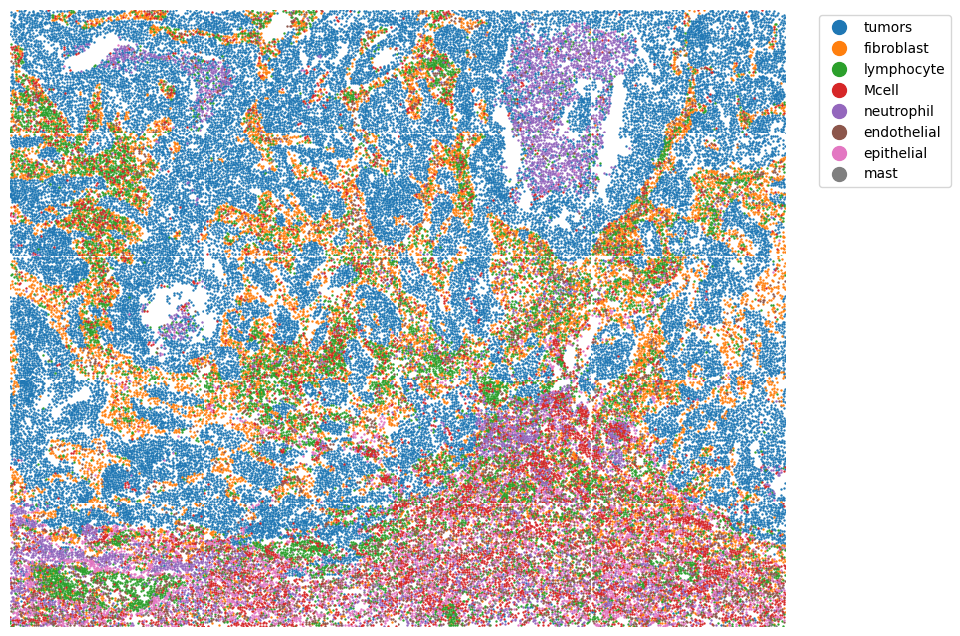

In [129]:
import numpy as np
from matplotlib import colormaps as mc

c_list = np.array(mc.get_cmap('tab10').colors)

import matplotlib.pyplot as plt
legend_handles = [plt.Line2D([], [], color=c_list[c], marker='o', linestyle='None', markersize=10, label=label) 
                  for label, c in label_map.items()]

import matplotlib.pyplot as plt
fig, ax = plt.subplots(5, 4, figsize=(10, 8))
for i in range(1, 21):
    ax_ = ax[4-(i-1)//4, (i-1)%4]
    data_ = data[data['fov']==i]
    for l, c in label_map.items():
        ax_.scatter(data_.loc[data_['cell_type']==l, 'CenterX_local_px'], data_.loc[data_['cell_type']==l, 'CenterY_local_px'], 
                color=c_list[c], s=0.5)
    ax_.set_xlim([data_['CenterX_local_px'].min(), data_['CenterX_local_px'].max()])
    ax_.set_ylim([data_['CenterY_local_px'].min(), data_['CenterY_local_px'].max()])
    ax_.set_xticks([])
    ax_.set_yticks([])
    for spine in ax_.spines.values():
        spine.set_visible(False)
        
fig.subplots_adjust(wspace=0, hspace=0)
fig.legend(handles=legend_handles, loc='lower center', bbox_to_anchor=(1, 0.65))
from pathlib import Path
Path('../figs/Nanostring/Visualization_competitors').mkdir(parents=True, exist_ok=True)
plt.savefig('../figs/Nanostring/Visualization_competitors/GT.png', bbox_inches='tight')

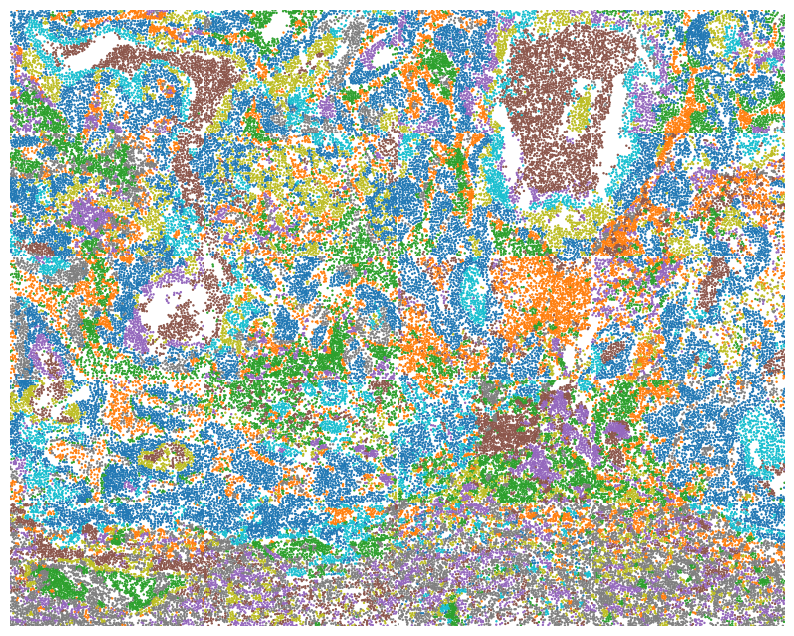

In [130]:
import matplotlib.pyplot as plt
fig, ax = plt.subplots(5, 4, figsize=(10, 8))

for i in range(1, 21):
    ax_ = ax[4-(i-1)//4, (i-1)%4]
    data_ = data[data['fov']==i]
    scatter = ax_.scatter(data_['CenterX_local_px'], data_['CenterY_local_px'], c=data_['pre_cell_type'].map(label_map), cmap='tab10', s=0.5)
    ax_.set_xlim([data_['CenterX_local_px'].min(), data_['CenterX_local_px'].max()])
    ax_.set_ylim([data_['CenterY_local_px'].min(), data_['CenterY_local_px'].max()])
    ax_.set_xticks([])
    ax_.set_yticks([])
    for spine in ax_.spines.values():
        spine.set_visible(False)

fig.subplots_adjust(wspace=0, hspace=0)
from pathlib import Path
Path('../figs/Nanostring/Visualization_competitors').mkdir(parents=True, exist_ok=True)
plt.savefig('../figs/Nanostring/Visualization_competitors/Ours.png', bbox_inches='tight')

In [ ]:
import os
import pandas as pd
label_map = {'tumors': 0, 'fibroblast': 1, 'lymphocyte': 2, 'Mcell': 3, 'neutrophil': 4, 'endothelial': 5, 'epithelial': 6, 'mast': 7}
label_map_ = {}
for k, v in label_map.items():
    label_map_[v] = k

path = '../tables/nanostring.xlsx'
methods = pd.read_excel(path)

# for method in ['Giotto']:
for method in methods.columns[:-1]:
    data = pd.read_csv(os.path.join('../../Nanostring', 'all_in_one.csv'))
    data['pre_cell_type'] = ''
    for i in range(1, 21):
        pred = pd.read_excel(path, sheet_name='fov'+str(i))[method].tolist()
        gt = data.loc[data['fov']==i, 'cell_type'].map(label_map).tolist()
        if len(set(gt)) == len(set(pred)):
            pred = hungarian_match(gt, pred)
        else:
            print(method+': fov'+str(i))
        data.loc[data['fov']==i, 'pre_cell_type'] = pred
        data.loc[data['fov']==i, 'pre_cell_type'] = data.loc[data['fov']==i, 'pre_cell_type'].map(label_map_)
        
    
    import matplotlib.pyplot as plt
    fig, ax = plt.subplots(5, 4, figsize=(10, 8))

    for i in range(1, 21):
        ax_ = ax[4-(i-1)//4, (i-1)%4]
        data_ = data[data['fov']==i]
        scatter = ax_.scatter(data_['CenterX_local_px'], data_['CenterY_local_px'], 
                              c=data_['pre_cell_type'].map(label_map), cmap='tab10', s=0.5)
        ax_.set_xlim([data_['CenterX_local_px'].min(), data_['CenterX_local_px'].max()])
        ax_.set_ylim([data_['CenterY_local_px'].min(), data_['CenterY_local_px'].max()])
        ax_.set_xticks([])
        ax_.set_yticks([])
        for spine in ax_.spines.values():
            spine.set_visible(False)

    fig.subplots_adjust(wspace=0, hspace=0)
    
    from pathlib import Path
    Path('../figs/Nanostring/Visualization_competitors').mkdir(parents=True, exist_ok=True)
    plt.savefig('../figs/Nanostring/Visualization_competitors/'+method+'.png', bbox_inches='tight')

In [2]:
import pandas as pd
import numpy as np
file_path = '../../TCGA/TCGA-LUAD.htseq_counts.tsv'
data = pd.read_csv(file_path, sep='\t')
data = data[~data['Ensembl_ID'].str.startswith('__')]
numeric_cols = data.select_dtypes(include=[np.number]).columns
data[numeric_cols] = data[numeric_cols].apply(lambda x: (np.power(2, x) - 1))

probeMap = pd.read_csv('../../TCGA/gencode.v22.annotation.gene.probeMap', sep='\t', header=0)

probe_gene_dict = {}
for index, row in probeMap.iterrows():
    probe_id = row['id']
    gene_symbol = row['gene']
    probe_gene_dict[probe_id] = gene_symbol
    
data['Ensembl_ID'] = data['Ensembl_ID'].map(probe_gene_dict)
data = data.groupby('Ensembl_ID').mean()
data = data.T

label_map = {'tumors': 0, 'fibroblast': 1, 'lymphocyte': 2, 'Mcell': 3, 'neutrophil': 4, 'endothelial': 5, 'epithelial': 6, 'mast': 7}

def load_Nano_data(id, root_path='./'):
    data = pd.read_csv(os.path.join(root_path, 'all_in_one.csv'))
    gene_feature_col = pd.read_csv(os.path.join(root_path, 'Lung9_Rep1_exprMat_file.csv')).columns[2:] #980 gene-related features 

    y = data[data['fov'] == id]['cell_type'] # the cell type is string type
    y = y.map(label_map).to_numpy()

    gene_fea = data[data['fov'] == id][gene_feature_col].to_numpy().astype(float)
    
    return gene_fea, y, np.array([data[data['fov'] == id]['CenterY_local_px'], data[data['fov'] == id]['CenterX_local_px']]).T, gene_feature_col

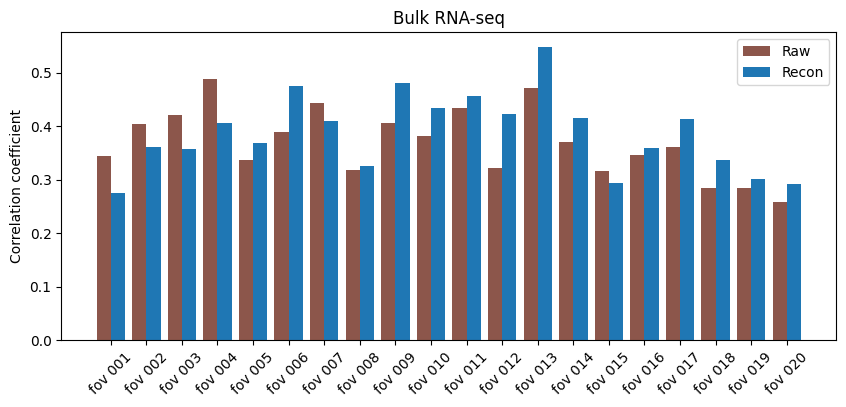

In [3]:
## individual slices

import os
import numpy as np
from scipy.stats import pearsonr

path = '../best_res/Nanostring/'
correlation = []
p_value = []
raw_exp, gt, loc, gene_id = load_Nano_data(1, root_path='../../Nanostring/')
bulk_col = data.columns.tolist()
common_elements = list(set(bulk_col).intersection(set(gene_id)))
gene_index = [gene_id.get_loc(i) for i in common_elements]

raw_exp_all = []
recon_exp_all = []

for i in range(1, 21):
    raw_exp, gt, loc, gene_id = load_Nano_data(i, root_path='../../Nanostring/')
    path_ = os.listdir(os.path.join(path, str(i).zfill(3)))[0]
    recon_exp = np.load(os.path.join(path, str(i).zfill(3), path_, 'recon_RNA.npy'), allow_pickle=True)
    recon_exp = np.where(recon_exp<0, 0, recon_exp)
    
    bulk_exp = data[common_elements].values
    raw_exp = raw_exp[:, gene_index]
    recon_exp = recon_exp[:, gene_index]
    
    raw_exp_all.append(raw_exp)
    recon_exp_all.append(recon_exp)
    
    bulk_exp_mean = bulk_exp.mean(axis=0)
    raw_exp_mean = raw_exp.mean(axis=0)
    recon_exp_mean = recon_exp.mean(axis=0)
    
    pearson_corr_raw, p_raw = pearsonr(raw_exp_mean, bulk_exp_mean)
    pearson_corr_recon, p_recon = pearsonr(recon_exp_mean, bulk_exp_mean)
    correlation.append([pearson_corr_raw, pearson_corr_recon])
    p_value.append([p_raw, p_recon])
    
    
from matplotlib import pyplot as plt
from matplotlib import colormaps as cm
colors = cm.get_cmap('tab10').colors
width = 0.4

fig, ax = plt.subplots(1, 1, figsize=(10, 4))
correlation = np.array(correlation).reshape(-1, 2)

ax.bar(np.arange(1, 21)-width/2, correlation[:, 0], label='Raw', width=width, color=colors[5])
ax.bar(np.arange(1, 21)+width/2, correlation[:, 1], label='Recon', width=width, color=colors[0])
ax.set_xticks(np.arange(1, 21))
ax.set_xticklabels(['fov '+str(i).zfill(3) for i in range(1, 21)], rotation=45)
ax.set_title('Bulk RNA-seq')
ax.set_ylabel('Correlation coefficient')
ax.legend()
plt.savefig('../figs/Nanostring/Correlation_coefficient.png')

In [32]:
ratio = 0.5

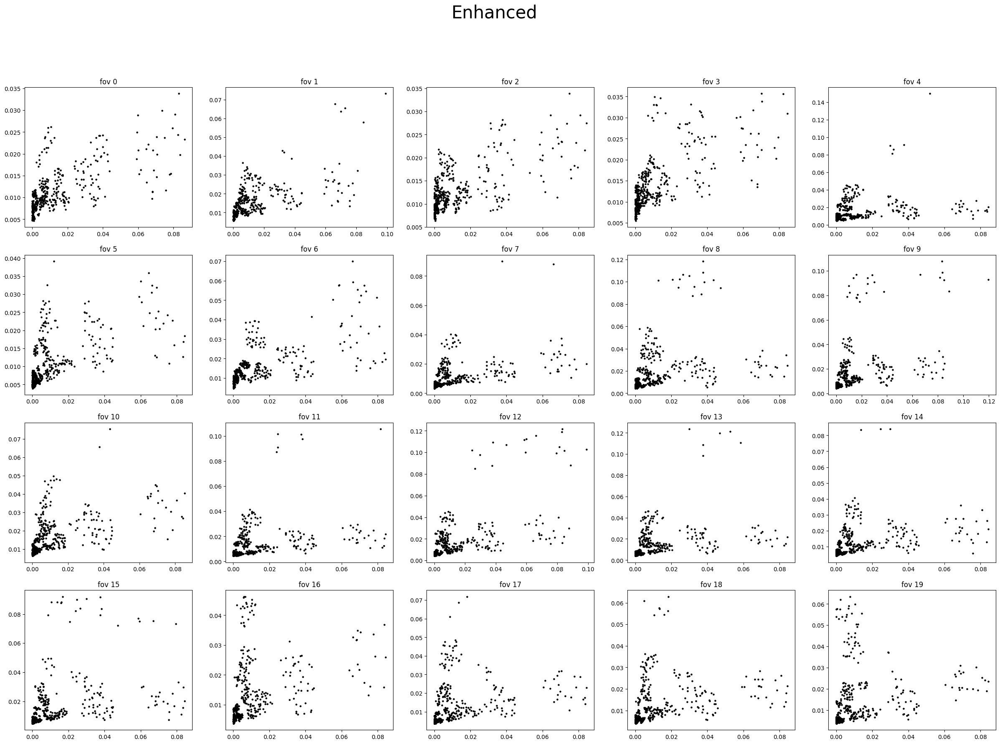

In [41]:
import matplotlib.pyplot as plt
from sklearn.neighbors import LocalOutlierFactor

fig, ax = plt.subplots(4, 5, figsize=(30, 20))
for i in range(20):
    raw_exp_mean = raw_exp_all[i].mean(axis=0)
    
    X = np.vstack([bulk_exp_mean/bulk_exp_mean.max(), raw_exp_mean/raw_exp_mean.max()]).T
    y_pred = LocalOutlierFactor(metric='euclidean', contamination=ratio).fit_predict(X)

    ax[i//5, i%5].scatter(X[y_pred==1, 0], X[y_pred==1, 1], color='k', s=5, label='Inliers')
    ax[i//5, i%5].set_title('fov '+str(i))
    
plt.suptitle('Enhanced', fontsize=30)
plt.savefig('../figs/Nanostring/Correlation_coefficient_scatter_raw.png')
plt.show()

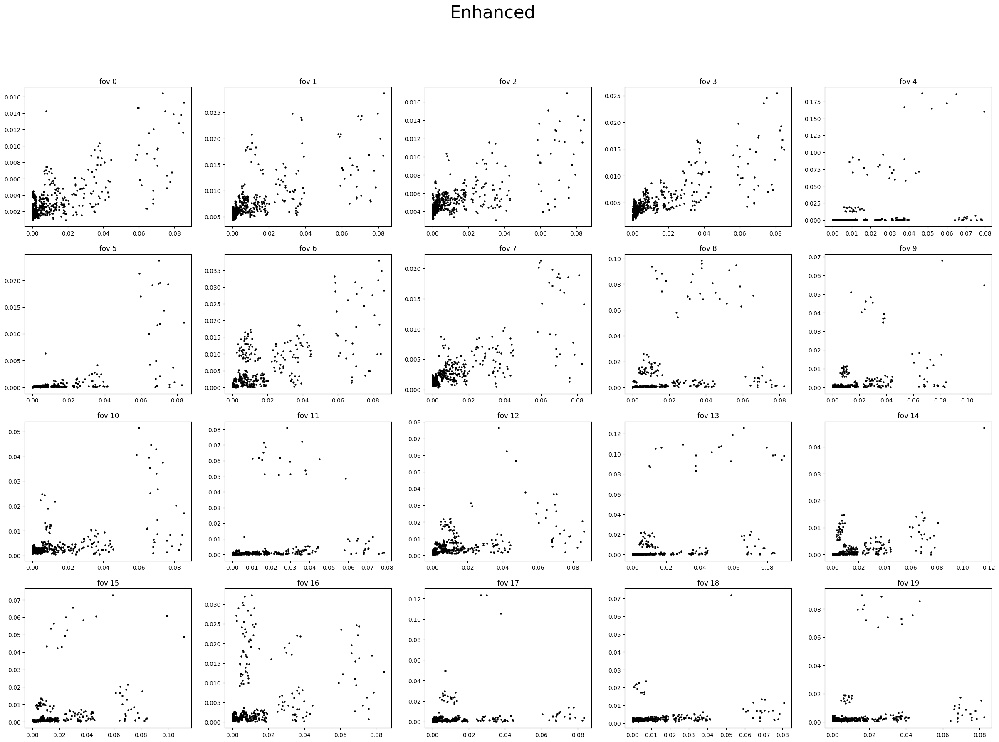

In [40]:
import matplotlib.pyplot as plt
from sklearn.neighbors import LocalOutlierFactor

fig, ax = plt.subplots(4, 5, figsize=(30, 20))
for i in range(20):
    recon_exp_mean = recon_exp_all[i].mean(axis=0)
    
    X = np.vstack([bulk_exp_mean/bulk_exp_mean.max(), recon_exp_mean/recon_exp_mean.max()]).T
    y_pred = LocalOutlierFactor(metric='euclidean', contamination=ratio).fit_predict(X)

    ax[i//5, i%5].scatter(X[y_pred==1, 0], X[y_pred==1, 1], color='k', s=5, label='Inliers')
    ax[i//5, i%5].set_title('fov '+str(i))

plt.suptitle('Enhanced', fontsize=30)
plt.savefig('../figs/Nanostring/Correlation_coefficient_scatter_enhanced.png')
plt.show()

In [10]:
## cotrained slices

import os
import numpy as np

path = '../best_res/Nanostring/'
correlation = []
p_value = []
raw_exp, gt, loc, gene_id = load_Nano_data(1, root_path='../../Nanostring/')
bulk_col = data.columns.tolist()
common_elements = list(set(bulk_col).intersection(set(gene_id)))
gene_index = [gene_id.get_loc(i) for i in common_elements]

bulk_exp = data[common_elements].values

raw_exp_all = []
for i in range(1, 21):
    raw_exp, gt, loc, gene_id = load_Nano_data(i, root_path='../../Nanostring/')
    raw_exp_all.append(raw_exp[:, gene_index])
    

import os
path = '../best_res/Nanostring/'
file_path = [f for f in os.listdir(os.path.join(path, 'ALL')) if f[0].isdigit()][0]
emb_enhanced_list = []

for i in range(1, 21):
    file = 'recon_RNA_'+str(i)+'.npy'
    emb = np.load(os.path.join(path, 'ALL', file_path, file))
    emb_enhanced_list.append(np.where(emb<0, 0, emb))

In [11]:
ratio = 0.5
bulk_exp_mean = bulk_exp.mean(axis=0)

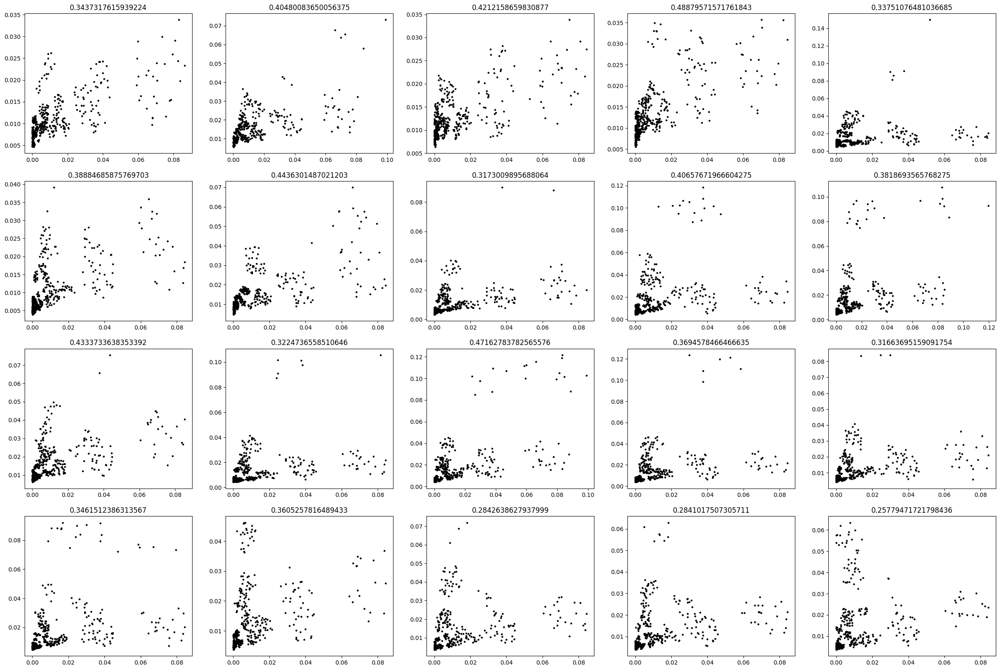

In [12]:
import matplotlib.pyplot as plt
from sklearn.neighbors import LocalOutlierFactor
from scipy.stats import pearsonr


fig, ax = plt.subplots(4, 5, figsize=(30, 20))
for i in range(20):
    raw_exp_mean = raw_exp_all[i].mean(axis=0)
    X = np.vstack([bulk_exp_mean/bulk_exp_mean.max(), raw_exp_mean/raw_exp_mean.max()]).T
    y_pred = LocalOutlierFactor(metric='euclidean', contamination=ratio).fit_predict(X)
    ax[i//5, i%5].scatter(X[y_pred==1, 0], X[y_pred==1, 1], color='k', s=5, label='Inliers')
    cor, _ = pearsonr(bulk_exp_mean, raw_exp_mean)
    ax[i//5, i%5].set_title(str(cor))
plt.show()

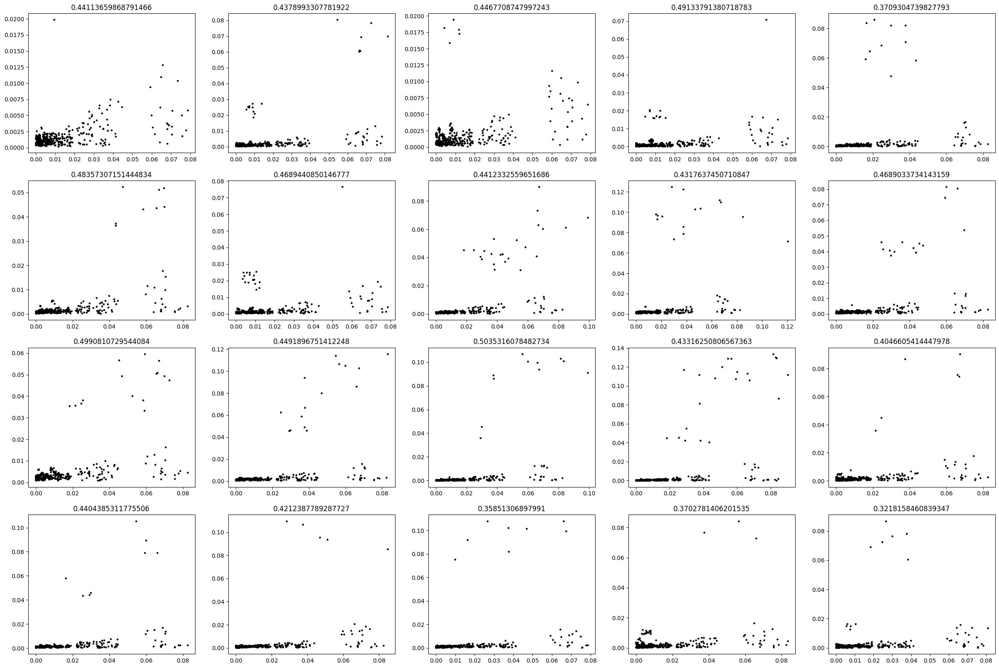

In [16]:
import matplotlib.pyplot as plt
from sklearn.neighbors import LocalOutlierFactor
from scipy.stats import pearsonr

fig, ax = plt.subplots(4, 5, figsize=(30, 20))
for i in range(20):
    emb_enhanced = emb_enhanced_list[i][:, gene_index]
    recon_exp_mean = np.where(emb_enhanced<0, 0, emb_enhanced).mean(axis=0)
    X = np.vstack([bulk_exp_mean/bulk_exp_mean.max(), recon_exp_mean/recon_exp_mean.max()]).T
    y_pred = LocalOutlierFactor(metric='euclidean', contamination=ratio).fit_predict(X)
    ax[i//5, i%5].scatter(X[y_pred==1, 0], X[y_pred==1, 1], color='k', s=5, label='Inliers')
    cor, _ = pearsonr(bulk_exp_mean, recon_exp_mean)
    ax[i//5, i%5].set_title(str(cor))
plt.show()

In [17]:
recon_exp_all_ = np.concatenate(emb_enhanced_list, axis=0)[:, gene_index]
recon_exp_all_ = np.where(recon_exp_all_<0, 0, recon_exp_all_).mean(axis=0)
raw_exp_all_ = np.concatenate(raw_exp_all, axis=0).mean(axis=0)

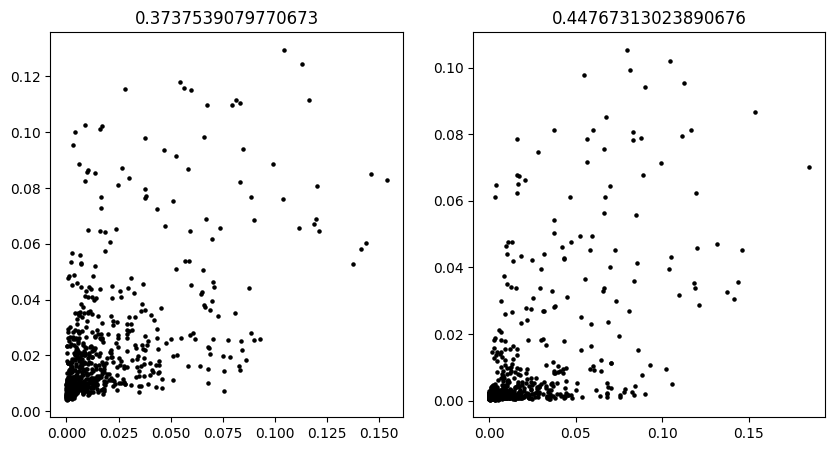

In [22]:
ratio = 0.1

fig, ax = plt.subplots(1, 2, figsize=(10, 5))

X = np.vstack([bulk_exp_mean/bulk_exp_mean.max(), raw_exp_all_/raw_exp_all_.max()]).T
y_pred = LocalOutlierFactor(metric='euclidean', contamination=ratio).fit_predict(X)
ax[0].scatter(X[y_pred==1, 0], X[y_pred==1, 1], color='k', s=5, label='Inliers')
cor, _ = pearsonr(bulk_exp_mean, raw_exp_all_)
ax[0].set_title(str(cor))

X = np.vstack([bulk_exp_mean/bulk_exp_mean.max(), recon_exp_all_/recon_exp_all_.max()]).T
y_pred = LocalOutlierFactor(metric='euclidean', contamination=ratio).fit_predict(X)
ax[1].scatter(X[y_pred==1, 0], X[y_pred==1, 1], color='k', s=5, label='Inliers')
cor, _ = pearsonr(bulk_exp_mean, recon_exp_all_)
ax[1].set_title(str(cor))
plt.show()

**LR PAIR**

In [1]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from scipy.stats import ttest_rel
# this function is from scipy 1.11
def fdr(ps, *, axis=0, method='bh'):
    # Input Validation and Special Cases
    ps = np.asarray(ps)

    ps_in_range = (np.issubdtype(ps.dtype, np.number)
                   and np.all(ps == np.clip(ps, 0, 1)))
    if not ps_in_range:
        raise ValueError("`ps` must include only numbers between 0 and 1.")

    methods = {'bh', 'by'}
    if method.lower() not in methods:
        raise ValueError(f"Unrecognized `method` '{method}'."
                         f"Method must be one of {methods}.")
    method = method.lower()

    if axis is None:
        axis = 0
        ps = ps.ravel()

    axis = np.asarray(axis)[()]
    if not np.issubdtype(axis.dtype, np.integer) or axis.size != 1:
        raise ValueError("`axis` must be an integer or `None`")

    if ps.size <= 1 or ps.shape[axis] <= 1:
        return ps[()]

    ps = np.moveaxis(ps, axis, -1)
    m = ps.shape[-1]
    order = np.argsort(ps, axis=-1)
    ps = np.take_along_axis(ps, order, axis=-1)  # this copies ps
    i = np.arange(1, m+1)
    ps *= m / i

    # Theorem 1.3 of [2]
    if method == 'by':
        ps *= np.sum(1 / i)
    np.minimum.accumulate(ps[..., ::-1], out=ps[..., ::-1], axis=-1)

    # Restore original order of axes and data
    np.put_along_axis(ps, order, values=ps.copy(), axis=-1)
    ps = np.moveaxis(ps, -1, axis)

    return np.clip(ps, 0, 1)

In [2]:
nano_gene = pd.read_csv('../../Nanostring/all_in_one.csv')

gene_col = nano_gene.columns[-980:].to_list()
gene_col = [i.lower() for i in gene_col]

lr_pairs = pd.read_csv('../../mergeall_LR_pairs_uniq.csv')
lr_pairs = lr_pairs.drop_duplicates()
print(lr_pairs.shape)
lr_pairs['pair1'] = lr_pairs['Pair.Name'].apply(lambda x: x.split('_')[0].lower())
lr_pairs['pair2'] = lr_pairs['Pair.Name'].apply(lambda x: x.split('_')[1].lower())

# only keep those rows can 'pair1' and 'pair2' in gene_col
lr_pairs = lr_pairs[lr_pairs['pair1'].isin(gene_col) & lr_pairs['pair2'].isin(gene_col)]
print(lr_pairs.shape)

(2097, 1)
(480, 3)


In [3]:
label_map = {'tumors': 0, 'fibroblast': 1, 'lymphocyte': 2, 'Mcell': 3, 'neutrophil': 4, 'endothelial': 5, 'epithelial': 6, 'mast': 7}

def load_Nano_data(id, root_path='./'):
    data = pd.read_csv(os.path.join(root_path, 'all_in_one.csv'))
    gene_feature_col = pd.read_csv(os.path.join(root_path, 'Lung9_Rep1_exprMat_file.csv')).columns[2:] #980 gene-related features 

    y = data[data['fov'] == id]['cell_type'] # the cell type is string type
    y = y.map(label_map).to_numpy()

    gene_fea = data[data['fov'] == id][gene_feature_col].to_numpy().astype(float)
    
    return gene_fea, y, np.array([data[data['fov'] == id]['CenterY_local_px'], data[data['fov'] == id]['CenterX_local_px']]).T, gene_feature_col

/home/wangpenglei/.conda/envs/SC/lib/python3.10/site-packages/seaborn/_oldcore.py:1498: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if pd.api.types.is_categorical_dtype(vector):
/home/wangpenglei/.conda/envs/SC/lib/python3.10/site-packages/seaborn/_oldcore.py:1498: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if pd.api.types.is_categorical_dtype(vector):


Text(0.5, 0, 'Raw specific')

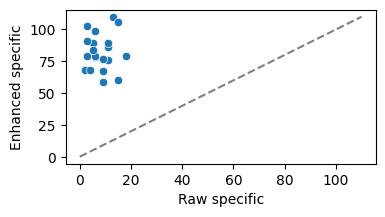

In [48]:
import os

path = '../best_res/Nanostring/'

e_specific = []
r_specific = []

for i in range(1, 21):
    results = pd.DataFrame(columns=['LR_pair', 'p_value', 'p_value_enhanced'])
    raw_exp, gt, loc, gene_col = load_Nano_data(i, root_path='../../Nanostring/')
    gene_col = [i.lower() for i in gene_col]
    # l2 norm 
    raw_exp = raw_exp / np.linalg.norm(raw_exp, axis=1, keepdims=True)
    raw_expression_matrix = raw_exp
    raw_expression_matrix = pd.DataFrame(raw_expression_matrix, columns=gene_col)

    path_ = os.listdir(os.path.join(path, str(i).zfill(3)))[0]
    enhanced_expression_matrix = np.load(os.path.join(path, str(i).zfill(3), path_, 'recon_RNA.npy'), allow_pickle=True)
    # enhanced_expression_matrix = np.where(enhanced_expression_matrix<0, 0, enhanced_expression_matrix)
    enhanced_expression_matrix = enhanced_expression_matrix / (np.linalg.norm(enhanced_expression_matrix, axis=1, keepdims=True)+1e-10)
    enhanced_expression_matrix = pd.DataFrame(enhanced_expression_matrix, columns=gene_col)
    assert raw_expression_matrix.shape == enhanced_expression_matrix.shape

    raw_expression_matrix = raw_expression_matrix.T
    enhanced_expression_matrix = enhanced_expression_matrix.T

    for id in range(len(lr_pairs)):
        ligand_gene = lr_pairs.iloc[id]['pair1']
        receptor_gene = lr_pairs.iloc[id]['pair2']
        pair = lr_pairs.iloc[id]['Pair.Name']

        # Extract expression data
        ligand_raw = raw_expression_matrix.loc[ligand_gene]
        receptor_raw = raw_expression_matrix.loc[receptor_gene]
        ligand_enhanced = enhanced_expression_matrix.loc[ligand_gene]
        receptor_enhanced = enhanced_expression_matrix.loc[receptor_gene]

        # Perform paired t-test
        test_result_raw = ttest_rel(ligand_raw, receptor_raw)
        test_result_enhanced = ttest_rel(ligand_enhanced, receptor_enhanced)
        results.loc[id] = [pair,test_result_raw[1],test_result_enhanced[1]]

    # Apply FDR correction for both raw and enhanced datasets
    # results['FDR_raw'] = multipletests(results['p_value'], method='fdr_bh')[1]
    # results['FDR_enhanced'] = multipletests(results['p_value_enhanced'], method='fdr_bh')[1]
    results['FDR_raw'] = fdr(results['p_value'])
    results['FDR_enhanced'] = fdr(results['p_value_enhanced'])

    # Add negative log-transformed FDR values for plotting
    results['logFDR_raw'] = -np.log10(results['FDR_raw']+1e-10)
    results['logFDR_enhanced'] = -np.log10(results['FDR_enhanced']+1e-10)

    results['shared'] = (results['p_value'] < 0.05) & (results['p_value_enhanced'] < 0.05)
    results['specific'] = (results['p_value'] < 0.05) | (results['p_value_enhanced'] < 0.05)
    results['specific'] = results['specific'] & (~results['shared'])

    results['not_significant'] = (results['p_value'] >= 0.05) & (results['p_value_enhanced'] >= 0.05)
    # turn into 'Shared', 'Specific', 'Not significant'
    results['pair_type'] = results[['shared', 'specific', 'not_significant']].idxmax(axis=1)

    results['specific_enhanced'] = (results['p_value'] >= 0.05) & (results['p_value_enhanced'] < 0.05)

    e_specific.append(results['specific_enhanced'].sum())
    r_specific.append(results['specific'].sum() - results['specific_enhanced'].sum())

plt.figure(figsize=(4, 2))
sns.scatterplot(x=r_specific, y=e_specific)
max_posssible = max(max(e_specific), max(r_specific))
plt.plot([0, max_posssible], [0, max_posssible], linestyle='--', color='grey')
plt.ylabel('Enhanced specific')
plt.xlabel('Raw specific')

/home/wangpenglei/.conda/envs/SC/lib/python3.10/site-packages/seaborn/_oldcore.py:1498: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if pd.api.types.is_categorical_dtype(vector):
/home/wangpenglei/.conda/envs/SC/lib/python3.10/site-packages/seaborn/_oldcore.py:1498: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if pd.api.types.is_categorical_dtype(vector):
/home/wangpenglei/.conda/envs/SC/lib/python3.10/site-packages/seaborn/_oldcore.py:1498: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if pd.api.types.is_categorical_dtype(vector):
/home/wangpenglei/.conda/envs/SC/lib/python3.10/site-packages/seaborn/_oldcore.py:1498: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future versi

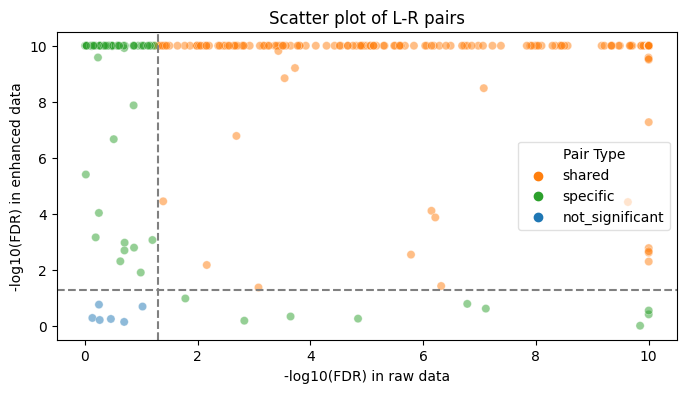

In [84]:
plt.figure(figsize=(8, 4))

from matplotlib import colormaps as cm

c_list = cm.get_cmap('tab10').colors

sns.scatterplot(data=results, x='logFDR_raw', y='logFDR_enhanced', hue='pair_type', 
                palette={'shared': c_list[1], 'specific': c_list[2], 'not_significant': c_list[0]}, alpha=0.5)

plt.axhline(y=-np.log10(0.05), linestyle='--', color='grey')
plt.axvline(x=-np.log10(0.05), linestyle='--', color='grey')
plt.title("Scatter plot of L-R pairs")
plt.xlabel("-log10(FDR) in raw data")
plt.ylabel("-log10(FDR) in enhanced data")
## set legend to outside the plot
plt.legend(title='Pair Type', loc='best', framealpha=0.6)
# plt.legend(title='Pair Type', loc='center left', bbox_to_anchor=(1, 0.5))
plt.savefig('../figs/Nanostring/LR_pair_visualization.png')
plt.show()